In [1]:
import os
import json
import random

In [2]:
train_q_file = "../../data/CLEVR_v1/data/CLEVR_train_questions.json"

In [3]:
with open(train_q_file) as f:
    train_questions = json.load(f)

In [13]:
info = train_questions['info']

In [4]:
questions = train_questions['questions']

In [17]:
questions[1]

{'image_index': 0,
 'program': [{'inputs': [], 'function': 'scene', 'value_inputs': []},
  {'inputs': [0], 'function': 'filter_size', 'value_inputs': ['small']},
  {'inputs': [1], 'function': 'filter_color', 'value_inputs': ['cyan']},
  {'inputs': [2], 'function': 'filter_material', 'value_inputs': ['rubber']},
  {'inputs': [3], 'function': 'unique', 'value_inputs': []},
  {'inputs': [4], 'function': 'same_shape', 'value_inputs': []},
  {'inputs': [5], 'function': 'count', 'value_inputs': []}],
 'question_index': 1,
 'image_filename': 'CLEVR_train_000000.png',
 'question_family_index': 43,
 'split': 'train',
 'answer': '2',
 'question': 'How many other things are there of the same shape as the tiny cyan matte object?'}

In [5]:
questions_dict = {}
for q in questions:
    questions_dict[q['question_index']] = q

In [6]:
def get_questions_with_word(word):
    word_questions = set()
    for k,v in questions_dict.items():
        if word in v['question']:
            word_questions.add(k)
    return word_questions

def get_total_word_count_and_data(subsampled_questions_dict):
    total_word_count = 0
    data = []
    for k,q in subsampled_questions_dict.items():
        line = q['question']
        line = line.strip('?').lower()
        line_as_list = line.split(" ")
        data += line_as_list
        total_word_count += len(line_as_list)
    return data, total_word_count

def get_token_counts(data):
    word_set = {"and", "or", "more", "fewer", "behind", "front", "same"}
    token_count_dict = {"and": 0, "or": 0, "more": 0, "fewer": 0, "behind": 0, "in front": 0, "same": 0}
    prev_word = ""
    for word in data:
        if word in word_set:
            if word == "front":
                if prev_word == "in":
                    token_count_dict["in front"] += 1
            else:
                token_count_dict[word] += 1
        prev_word = word
    return token_count_dict

In [8]:
and_questions = get_questions_with_word(" and ")

In [9]:
or_questions = get_questions_with_word(" or ")

In [8]:
more_questions = get_questions_with_word(" more ")

In [10]:
and_answers = {}
for q in and_questions:
    ans = questions_dict[q]["answer"]
    if ans in and_answers:
        and_answers[ans] += 1
    else:
        and_answers[ans] = 1
    

In [11]:
and_answers

{'rubber': 3898,
 'yellow': 980,
 'yes': 20673,
 'no': 21463,
 'cube': 2660,
 'green': 955,
 'large': 3843,
 'small': 3936,
 '1': 2887,
 'cyan': 933,
 '2': 1120,
 'cylinder': 2590,
 '0': 3084,
 'sphere': 2661,
 'metal': 3986,
 'brown': 975,
 'blue': 1008,
 'red': 1038,
 'gray': 966,
 'purple': 1009,
 '5': 105,
 '6': 52,
 '3': 426,
 '4': 217,
 '7': 28,
 '8': 13}

In [12]:
or_answers = {}
for q in or_questions:
    ans = questions_dict[q]["answer"]
    if ans in or_answers:
        or_answers[ans] += 1
    else:
        or_answers[ans] = 1

In [13]:
or_answers

{'1': 20657,
 '2': 16445,
 '0': 11665,
 '3': 8517,
 '4': 3333,
 '6': 651,
 '7': 288,
 '5': 1423,
 '8': 149,
 '9': 74,
 '10': 12}

In [9]:
more_answers = {}
for q in more_questions:
    ans = questions_dict[q]["answer"]
    if ans in more_answers:
        more_answers[ans] += 1
    else:
        more_answers[ans] = 1

In [10]:
more_answers

{'yes': 5549, 'no': 6021}

In [7]:
from IPython.display import Image

In [20]:
for q in more_questions:
    ans = questions_dict[q]["answer"]
    if ans == "no":
        que = questions_dict[q]["question"]
        image = questions_dict[q]["image_filename"]
        print(que, image)

Are there more cyan things that are in front of the small cyan metal thing than small things? CLEVR_train_058985.png
Are there more tiny metal objects behind the gray thing than rubber objects that are left of the small brown ball? CLEVR_train_036047.png
Are there more green shiny cylinders left of the gray rubber cube than tiny blue cylinders that are behind the big red cube? CLEVR_train_058986.png
Are there more brown metallic objects that are on the left side of the big ball than metal cylinders? CLEVR_train_052433.png
Are there more yellow things on the right side of the small purple ball than small brown things? CLEVR_train_019665.png
Are there more big rubber balls in front of the large green rubber object than matte things right of the tiny blue cylinder? CLEVR_train_045881.png
Are there more small spheres right of the purple ball than spheres in front of the gray cylinder? CLEVR_train_019667.png
Are there more large brown cubes in front of the brown metal object than yellow met

Are there more big rubber cylinders on the right side of the cyan rubber cylinder than cylinders that are in front of the blue thing? CLEVR_train_069183.png
Are there more large brown metallic spheres that are behind the big gray cylinder than large brown matte objects? CLEVR_train_062630.png
Are there more small red things than tiny things? CLEVR_train_026586.png
Are there more tiny rubber cylinders than large blue metallic things? CLEVR_train_000371.png
Are there more brown things than matte cylinders? CLEVR_train_029863.png
Are there more tiny purple metallic spheres that are on the right side of the big blue rubber cylinder than large brown rubber objects? CLEVR_train_029863.png
Are there more large cylinders than metal things? CLEVR_train_056078.png
Are there more gray matte spheres than yellow things? CLEVR_train_006925.png
Are there more tiny yellow matte objects right of the large purple cube than large spheres on the left side of the yellow rubber object? CLEVR_train_049525.pn

Are there more metallic cubes that are behind the big brown metallic thing than big purple shiny objects that are behind the purple cube? CLEVR_train_000931.png
Are there more brown balls that are to the right of the cyan shiny cylinder than big blue things that are behind the large yellow metal sphere? CLEVR_train_027147.png
Are there more big metal balls in front of the large green metal block than large things behind the blue block? CLEVR_train_059915.png
Are there more brown shiny cylinders than large rubber spheres? CLEVR_train_053362.png
Are there more purple rubber cubes that are on the left side of the large cyan rubber thing than metallic things? CLEVR_train_053362.png
Are there more large brown metal spheres than small cyan rubber objects? CLEVR_train_056639.png
Are there more tiny brown metal objects that are in front of the small matte cylinder than small spheres that are on the right side of the big sphere? CLEVR_train_020595.png
Are there more tiny things in front of the 

Are there more big cyan objects behind the big green thing than brown rubber blocks on the right side of the tiny green ball? CLEVR_train_044160.png
Are there more brown blocks in front of the big brown rubber block than large brown matte objects that are in front of the big green metal cylinder? CLEVR_train_047437.png
Are there more large cyan shiny things in front of the cyan object than cyan blocks in front of the large red thing? CLEVR_train_001562.png
Are there more tiny red cylinders than things? CLEVR_train_053992.png
Are there more large red balls than red objects? CLEVR_train_027778.png
Are there more tiny cylinders than objects? CLEVR_train_037609.png
Are there more tiny gray blocks than cubes? CLEVR_train_001563.png
Are there more small metal spheres on the left side of the blue metallic thing than big metal spheres right of the small brown rubber object? CLEVR_train_001564.png
Are there more big yellow metal blocks that are behind the tiny cyan sphere than tiny yellow block

Are there more spheres than objects? CLEVR_train_051388.png
Are there more big gray rubber balls in front of the tiny blue metallic object than large gray rubber spheres in front of the metal ball? CLEVR_train_044835.png
Are there more brown shiny things behind the cylinder than tiny cylinders? CLEVR_train_044835.png
Are there more big red cylinders that are right of the ball than tiny blue shiny cylinders that are behind the cyan cylinder? CLEVR_train_018620.png
Are there more things left of the small blue object than big gray matte objects in front of the metal thing? CLEVR_train_054666.png
Are there more small gray metallic spheres than big metal balls? CLEVR_train_044836.png
Are there more yellow shiny balls than cylinders? CLEVR_train_038283.png
Are there more red metal spheres than large brown cylinders? CLEVR_train_054667.png
Are there more blue metallic cylinders that are to the left of the tiny blue object than large blue cubes? CLEVR_train_015346.png
Are there more gray block

Are there more green matte cylinders that are to the left of the matte cylinder than big green blocks? CLEVR_train_032326.png
Are there more tiny matte cylinders behind the small shiny ball than tiny yellow objects behind the small green object? CLEVR_train_035603.png
Are there more purple cylinders than big metallic cylinders? CLEVR_train_029049.png
Are there more big gray rubber spheres behind the large metallic sphere than blue rubber cylinders that are left of the yellow ball? CLEVR_train_038879.png
Are there more cyan blocks than big cyan objects? CLEVR_train_042156.png
Are there more large cyan shiny cylinders that are behind the cyan thing than brown matte blocks that are in front of the small cylinder? CLEVR_train_009389.png
Are there more cyan things in front of the big metal thing than blue metallic cylinders? CLEVR_train_002835.png
Are there more small balls that are on the right side of the big metallic sphere than large yellow spheres behind the small matte sphere? CLEVR_t

Are there more small yellow metal balls that are behind the green rubber cylinder than brown metallic balls behind the big cyan block? CLEVR_train_036019.png
Are there more red metallic balls behind the yellow matte block than tiny purple shiny things? CLEVR_train_058957.png
Are there more small blocks than tiny brown spheres? CLEVR_train_068787.png
Are there more large red metallic balls right of the green object than red things that are to the left of the big red metal ball? CLEVR_train_003251.png
Are there more small rubber spheres than tiny shiny cylinders? CLEVR_train_016360.png
Are there more small red cylinders to the right of the purple matte sphere than large yellow rubber things? CLEVR_train_036021.png
Are there more gray objects to the left of the green matte thing than tiny shiny things? CLEVR_train_042575.png
Are there more cyan matte blocks than cylinders? CLEVR_train_042577.png
Are there more tiny metal objects on the left side of the cyan rubber cube than tiny yellow th

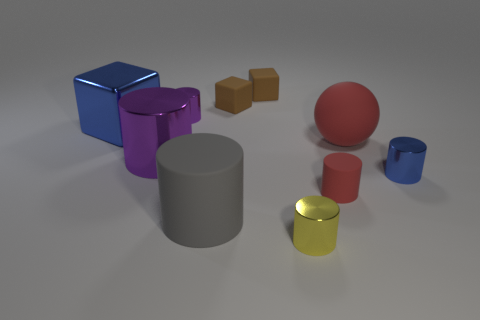

In [8]:
Image(filename='../../data/CLEVR_v1/images/train/CLEVR_train_009846.png')

In [164]:
Are there more cylinders that are behind the large purple shiny cylinder than tiny yellow cylinders? CLEVR_train_009846.png
Image(filename='../../data/CLEVR_v1/images/train/CLEVR_train_009846.png')
Are there more big cyan blocks in front of the large cyan thing than blue cylinders? CLEVR_train_022954.png
Image(filename='../../data/CLEVR_v1/images/train/CLEVR_train_022954.png') 
Are there more balls that are in front of the brown rubber object than tiny cyan things?
Image(filename='../../data/CLEVR_v1/images/train/CLEVR_train_068857.png') 

SyntaxError: invalid syntax (<ipython-input-164-80809ffcc057>, line 1)

In [15]:
for q in and_questions:
    ans = questions_dict[q]["answer"]
    if ans in ["yes", "no"]:
        print(questions_dict[q]["question"] )

Do the gray metallic thing behind the cyan shiny sphere and the purple object have the same size?
Are there an equal number of big purple shiny things on the left side of the tiny cyan object and big purple cylinders to the right of the blue ball?
Are there an equal number of metal things on the right side of the brown shiny cube and blue shiny things?
Are there an equal number of big green objects behind the green sphere and tiny green balls that are behind the large purple object?
Are there the same number of blue rubber cubes on the left side of the large blue thing and tiny green matte cylinders?
Do the cube and the cylinder have the same color?
Do the shiny cylinder that is behind the yellow metallic object and the metal cube have the same color?
Are there an equal number of rubber balls that are to the left of the large gray thing and small cyan matte balls to the right of the big brown ball?
Do the gray cube and the gray metallic cylinder have the same size?
Do the green shiny t

Do the matte ball and the brown shiny thing have the same size?
Are the thing that is right of the metallic block and the large block on the right side of the tiny blue thing made of the same material?
Do the yellow rubber cylinder and the rubber block that is behind the cyan metallic object have the same size?
Are there the same number of small gray objects that are to the right of the red object and small green matte cylinders?
Do the shiny sphere and the cyan metal cylinder have the same size?
Do the brown thing that is behind the matte thing and the brown rubber object have the same shape?
Do the object that is right of the brown metal object and the blue metallic thing have the same size?
Are the large object left of the gray rubber cube and the thing in front of the blue metallic cylinder made of the same material?
Do the blue matte object and the block to the left of the yellow object have the same size?
Are there an equal number of cyan metallic blocks that are on the right sid

Are the tiny cube on the left side of the tiny yellow cylinder and the sphere made of the same material?
Do the small cylinder that is in front of the large blue cylinder and the tiny block on the right side of the blue metallic cylinder have the same color?
Are there the same number of gray rubber cubes in front of the big gray matte cube and large brown rubber blocks on the right side of the blue cube?
Do the cylinder and the cyan rubber sphere have the same size?
Do the big rubber thing and the brown shiny object have the same shape?
Do the big gray thing and the gray rubber thing have the same shape?
Do the large cylinder behind the big rubber block and the tiny cyan cube have the same material?
Are there the same number of metal cylinders right of the large metal sphere and big shiny spheres?
Do the tiny brown cylinder and the ball on the right side of the tiny cyan object have the same material?
Are there the same number of blue cylinders that are to the right of the big cube and

Do the matte ball that is to the right of the brown ball and the large cyan rubber thing have the same size?
Do the blue thing that is behind the big shiny sphere and the object that is in front of the large purple sphere have the same size?
Do the big object and the tiny sphere have the same color?
Are there an equal number of big yellow objects that are left of the yellow matte object and small cyan balls behind the small purple cube?
Are there the same number of small metal things behind the small green cube and brown metal balls that are on the right side of the big ball?
Do the shiny thing and the big rubber cylinder that is in front of the small cyan matte thing have the same color?
Do the metal sphere and the purple metal thing that is right of the big green matte object have the same size?
Do the red object on the right side of the small gray cube and the purple object have the same material?
Do the blue cylinder and the small cylinder behind the big object have the same materi

Are there the same number of red things that are on the right side of the tiny matte cylinder and rubber things in front of the tiny shiny thing?
Do the large cyan thing and the small brown block have the same material?
Do the tiny metal block and the tiny ball have the same color?
Do the small metal cylinder that is on the left side of the cyan matte sphere and the tiny cylinder that is to the right of the purple matte ball have the same color?
Do the blue ball left of the gray cube and the big yellow object have the same material?
Do the brown cube and the green rubber cylinder have the same size?
Are there an equal number of tiny red metal things that are to the right of the large red metal object and rubber blocks that are to the right of the red shiny cube?
Are the sphere that is on the left side of the small metallic thing and the big cube made of the same material?
Do the red sphere and the big thing behind the big red metal object have the same material?
Do the gray cylinder an

Are the yellow object and the big brown sphere made of the same material?
Do the cyan rubber object and the blue shiny ball have the same size?
Do the matte cube and the brown rubber sphere have the same size?
Do the metallic thing left of the big purple thing and the large red thing have the same shape?
Are the tiny thing in front of the purple cube and the cube made of the same material?
Do the cylinder and the tiny metallic ball have the same color?
Are the small thing that is in front of the big shiny object and the large sphere made of the same material?
Do the tiny rubber object that is in front of the cyan cube and the block right of the yellow matte thing have the same color?
Are the tiny yellow thing in front of the tiny yellow metallic cube and the large purple cube made of the same material?
Do the red metallic thing and the small yellow matte object have the same shape?
Are there the same number of small purple balls behind the green matte cylinder and large brown shiny cyl

Do the yellow matte thing and the blue rubber thing have the same shape?
Do the yellow rubber sphere and the rubber cylinder have the same size?
Do the big block and the small sphere behind the cyan metal thing have the same material?
Do the gray thing and the tiny thing that is on the right side of the brown block have the same material?
Are there the same number of red cubes that are in front of the yellow metal cylinder and red cubes that are to the right of the large rubber cylinder?
Are there the same number of small yellow metallic cylinders on the right side of the yellow shiny cylinder and red cubes?
Do the sphere and the red cube have the same size?
Are there the same number of small yellow things that are to the left of the tiny sphere and large objects in front of the red metallic cylinder?
Do the metallic cylinder that is on the left side of the large red thing and the red metallic object behind the large matte block have the same size?
Do the large cylinder that is on the 

Are there the same number of big gray metallic cubes in front of the large green object and large green shiny things behind the large purple rubber thing?
Do the green thing and the brown metal object have the same shape?
Do the matte cube that is right of the small yellow matte cube and the rubber sphere that is to the left of the small gray thing have the same size?
Do the matte thing behind the red shiny object and the ball have the same color?
Do the purple rubber thing and the yellow block have the same size?
Are there an equal number of large blue shiny cylinders to the left of the large blue metal cylinder and large brown rubber balls?
Are the tiny purple block and the tiny red sphere made of the same material?
Are the tiny block and the thing right of the large gray matte sphere made of the same material?
Do the large gray thing and the block behind the big block have the same material?
Do the red metallic object and the small green thing on the left side of the big yellow matt

Do the cube that is behind the brown shiny ball and the sphere that is in front of the cyan object have the same color?
Do the red rubber cylinder and the blue metallic object that is in front of the large matte ball have the same size?
Are the small block and the blue object that is behind the big blue rubber cube made of the same material?
Do the metallic cube and the brown metal object have the same size?
Do the matte block and the metal object that is behind the large blue object have the same size?
Do the large metal object that is right of the purple block and the tiny object have the same color?
Are there the same number of big cubes that are behind the small rubber thing and purple rubber blocks?
Do the small matte thing and the tiny cube have the same color?
Are there the same number of tiny metal cylinders in front of the tiny red matte thing and yellow shiny objects that are behind the small red metal object?
Do the small brown cylinder and the small object that is to the le

Are there an equal number of shiny objects in front of the yellow block and blue blocks that are behind the small metallic block?
Do the green metal thing and the yellow shiny cylinder have the same size?
Do the small shiny cube and the rubber cube have the same color?
Do the small shiny cube that is on the right side of the cyan cube and the tiny cylinder that is behind the large cylinder have the same color?
Do the rubber cylinder and the small metallic cylinder have the same color?
Are the tiny yellow sphere on the left side of the blue metallic thing and the big brown thing that is in front of the red matte cube made of the same material?
Do the green cube that is behind the large matte cylinder and the large cyan cylinder have the same material?
Do the matte object that is to the left of the tiny rubber sphere and the tiny purple object have the same shape?
Do the blue rubber thing and the metal cube have the same size?
Do the large cyan thing and the matte object left of the cyan

Do the big ball that is in front of the yellow rubber object and the red cube have the same material?
Do the gray rubber object and the tiny brown object have the same shape?
Do the big matte cylinder and the large shiny cylinder have the same color?
Do the small matte thing behind the small cyan cylinder and the small shiny object left of the purple rubber cylinder have the same shape?
Do the big thing that is in front of the tiny cyan sphere and the matte thing that is right of the small cyan cube have the same color?
Do the large ball behind the small yellow metallic sphere and the sphere on the right side of the green rubber ball have the same color?
Do the gray cube that is on the right side of the yellow rubber thing and the gray sphere have the same material?
Do the tiny thing to the right of the large green metal thing and the big yellow thing have the same material?
Do the small cyan matte object and the blue thing have the same shape?
Do the metal cylinder and the blue block 

Are the big cube that is in front of the brown matte cube and the big brown cylinder made of the same material?
Do the small brown rubber thing and the small green thing have the same shape?
Do the brown cylinder and the tiny thing that is on the right side of the big brown shiny sphere have the same material?
Do the tiny yellow matte object and the big cyan thing that is behind the large gray object have the same shape?
Do the tiny block and the metallic sphere have the same color?
Do the rubber sphere that is in front of the green cylinder and the small cube have the same color?
Do the matte object on the left side of the red matte cube and the big red metallic cylinder have the same size?
Do the red rubber cylinder and the shiny cylinder have the same size?
Are there an equal number of small purple balls that are on the left side of the large rubber cylinder and big green matte things?
Do the small purple object and the cube have the same material?
Do the tiny object and the big shi

Do the block that is right of the cyan rubber object and the brown cylinder that is in front of the cyan cylinder have the same size?
Are the big blue object that is behind the big gray rubber thing and the small thing made of the same material?
Do the small matte cylinder in front of the big matte cylinder and the matte cylinder to the right of the tiny yellow cylinder have the same color?
Are the block that is behind the big yellow rubber object and the large green ball made of the same material?
Do the purple ball behind the large gray ball and the cyan cube have the same material?
Do the red cylinder and the gray rubber cube have the same size?
Do the object that is behind the small red metal object and the tiny metallic thing that is to the left of the purple matte object have the same shape?
Are the tiny thing on the left side of the big metal block and the small red object made of the same material?
Do the large sphere and the thing in front of the brown rubber cylinder have the

Do the big matte object and the large cyan metal thing have the same shape?
Are the brown sphere and the block that is right of the gray ball made of the same material?
Do the big purple block that is on the left side of the big yellow matte block and the blue block have the same material?
Are there an equal number of gray cubes in front of the gray block and blue metal balls?
Do the big cube and the small red thing have the same material?
Are there the same number of small green shiny balls behind the small gray thing and yellow things that are to the left of the purple shiny object?
Do the small brown shiny thing to the left of the big ball and the tiny cyan object have the same shape?
Do the cube and the cyan thing have the same size?
Are the green thing and the tiny red cylinder made of the same material?
Are the large sphere that is right of the tiny matte block and the blue thing that is in front of the tiny yellow matte sphere made of the same material?
Do the matte cube and the

Do the large cylinder and the object right of the cyan matte cylinder have the same material?
Are there the same number of blue balls that are to the left of the small green cube and tiny green cubes?
Do the blue matte cylinder and the yellow cylinder have the same size?
Do the big metal thing behind the big blue shiny cylinder and the blue thing that is in front of the small blue object have the same shape?
Do the big sphere and the large thing in front of the big purple matte ball have the same material?
Are there the same number of shiny cylinders left of the small cyan shiny cylinder and small red matte cylinders that are behind the gray cylinder?
Are the block that is in front of the gray cube and the gray thing that is in front of the small gray metallic object made of the same material?
Do the tiny blue object and the tiny green object that is behind the blue matte block have the same material?
Do the big metallic sphere and the tiny metallic cylinder have the same color?
Are th

Are there an equal number of brown matte balls behind the tiny brown matte block and blocks right of the yellow object?
Do the matte block and the matte cylinder have the same color?
Do the big sphere that is left of the brown shiny cylinder and the big blue object have the same material?
Do the metallic sphere in front of the red metallic block and the matte cylinder have the same size?
Do the matte thing to the left of the matte cylinder and the gray shiny object have the same shape?
Are the small thing and the big blue ball made of the same material?
Are there the same number of big blue things on the left side of the large blue metallic object and blue objects in front of the tiny metal thing?
Are the object right of the small matte sphere and the tiny green cylinder made of the same material?
Are there an equal number of big yellow matte things to the left of the small purple rubber cube and big cylinders?
Do the matte thing in front of the brown cylinder and the brown cylinder ha

Are the big gray thing and the tiny cyan object made of the same material?
Are there an equal number of tiny yellow metallic objects that are left of the large gray rubber object and blue metal spheres behind the block?
Are the large gray cube and the big green ball made of the same material?
Do the large rubber sphere and the large metal cylinder have the same color?
Are the large object that is in front of the large rubber ball and the big cylinder on the left side of the large yellow matte thing made of the same material?
Are the large cyan thing that is to the left of the large cyan metallic cylinder and the brown object right of the matte ball made of the same material?
Are there the same number of large cyan metal blocks left of the large green shiny cylinder and cubes in front of the red matte object?
Are there an equal number of small metal cylinders in front of the tiny rubber sphere and large purple metallic cylinders?
Are there an equal number of yellow rubber cylinders that

Do the green object and the sphere have the same size?
Do the green object and the shiny thing have the same size?
Are there the same number of tiny purple rubber spheres that are right of the big red cylinder and yellow rubber spheres on the right side of the cyan rubber thing?
Do the block that is to the right of the rubber cube and the yellow cube have the same material?
Do the rubber cylinder and the tiny metal sphere have the same color?
Do the cube and the big ball that is in front of the red block have the same material?
Are the small red ball and the big object behind the big metal sphere made of the same material?
Do the red metallic object behind the rubber cylinder and the large red cube have the same size?
Do the blue metal thing on the left side of the blue shiny ball and the tiny rubber object have the same shape?
Are there an equal number of small red balls behind the tiny blue cylinder and brown blocks that are right of the purple shiny object?
Do the tiny red thing on 

Do the brown rubber cylinder and the gray rubber sphere have the same size?
Are there the same number of rubber cubes behind the shiny cube and tiny gray metallic balls?
Do the purple sphere and the block left of the tiny cyan cube have the same material?
Are the small yellow object and the cyan cylinder in front of the small yellow cylinder made of the same material?
Do the big brown object and the big cyan thing have the same shape?
Are the big gray object and the tiny cyan cube that is to the right of the green cylinder made of the same material?
Are there the same number of cyan shiny things that are to the left of the big cyan ball and purple objects that are on the right side of the matte block?
Do the tiny metal thing right of the yellow cylinder and the small rubber cylinder that is behind the cube have the same color?
Do the big block and the shiny cylinder have the same color?
Are there the same number of rubber cylinders that are in front of the cyan metallic object and gray

Are there an equal number of matte balls that are in front of the small cylinder and big metal things?
Are the blue cube and the small sphere behind the blue matte block made of the same material?
Do the big object that is on the right side of the small yellow block and the cylinder on the right side of the large green object have the same color?
Are there an equal number of tiny yellow objects in front of the blue rubber block and metallic objects?
Do the large thing that is to the right of the large cyan metallic block and the gray block have the same material?
Are there the same number of purple shiny blocks that are in front of the purple metallic thing and cyan things on the right side of the purple rubber object?
Do the large brown object and the big object behind the large metallic ball have the same shape?
Do the large purple shiny thing and the cyan metallic object have the same shape?
Do the object that is on the left side of the brown matte cylinder and the matte object behi

Do the purple metallic thing that is on the right side of the purple sphere and the big green rubber sphere have the same size?
Are there an equal number of rubber blocks that are on the right side of the cyan ball and small objects that are behind the red metallic cylinder?
Are the tiny red object and the large brown cube made of the same material?
Do the big green shiny object and the metal object that is behind the tiny shiny cylinder have the same shape?
Are there the same number of gray things to the right of the tiny shiny thing and matte cylinders?
Do the gray shiny object and the cyan cylinder have the same size?
Are there the same number of green metal spheres that are on the right side of the small cyan cylinder and brown rubber balls behind the blue object?
Do the red metal object and the green sphere have the same size?
Do the small object in front of the gray cube and the large block that is in front of the large blue matte ball have the same color?
Do the big rubber cylin

Are there the same number of large metallic cubes that are right of the matte cylinder and tiny blue matte cylinders?
Are there an equal number of large metal balls in front of the tiny gray metal object and tiny gray things behind the large thing?
Do the purple object and the blue object that is in front of the purple matte object have the same size?
Do the blue block and the purple rubber ball have the same size?
Do the shiny object left of the large purple cube and the big metal thing have the same shape?
Do the red thing and the sphere that is on the left side of the brown metal cylinder have the same material?
Do the small cyan cylinder and the tiny blue thing that is left of the purple cylinder have the same material?
Do the cyan cube in front of the red metal cylinder and the large metal sphere have the same size?
Are there an equal number of big purple metal things that are behind the purple shiny block and blocks that are right of the small cylinder?
Do the red object on the l

Do the cyan shiny object and the metal object behind the rubber cube have the same size?
Are there the same number of big things left of the cyan cylinder and big brown metallic blocks?
Are the tiny purple cylinder and the yellow thing that is behind the tiny yellow rubber sphere made of the same material?
Are there the same number of large blue metal objects that are behind the big blue thing and brown shiny objects that are on the right side of the cyan rubber object?
Do the brown cylinder and the gray object that is in front of the ball have the same size?
Do the gray metal object and the matte object that is to the left of the green object have the same shape?
Do the red thing to the left of the matte cylinder and the tiny red rubber cube have the same size?
Are there an equal number of small metallic spheres in front of the big green matte thing and small balls?
Are the small sphere and the tiny cyan object made of the same material?
Are there an equal number of red matte blocks i

Do the purple matte object and the large cyan thing that is in front of the cyan matte ball have the same shape?
Are there an equal number of tiny cyan cylinders that are to the right of the large green matte object and small blue objects?
Do the cube that is on the right side of the purple rubber block and the small sphere have the same size?
Are there the same number of cylinders that are in front of the cyan cylinder and large objects that are in front of the tiny rubber block?
Do the blue matte object and the metal sphere have the same size?
Do the purple shiny thing and the purple cylinder behind the green metallic thing have the same size?
Do the large object that is on the left side of the large yellow object and the small purple object have the same material?
Are there an equal number of matte balls that are to the left of the small gray thing and purple rubber things behind the big purple sphere?
Do the purple ball and the gray thing that is in front of the tiny brown metal bl

Do the large block and the small brown cylinder have the same material?
Do the matte sphere and the red shiny object that is behind the small red shiny sphere have the same size?
Are there an equal number of large green things that are left of the red matte block and yellow metallic things?
Do the cube and the tiny ball have the same color?
Do the large cylinder that is behind the big cyan matte thing and the matte cylinder on the right side of the small cyan cylinder have the same color?
Do the large rubber block that is to the right of the blue matte cube and the matte thing behind the large blue matte cube have the same color?
Are the block behind the blue rubber block and the large brown thing made of the same material?
Are the brown thing and the green thing made of the same material?
Are there the same number of green cubes that are left of the yellow cylinder and large green rubber things?
Do the sphere to the left of the shiny object and the metallic ball have the same size?
Do

In [16]:
for q in or_questions:
    que = questions_dict[q]["question"]
    print(questions_dict[q]["question"])

How many things are either blue cylinders that are behind the gray object or shiny cylinders?
What number of objects are cylinders that are on the right side of the yellow matte object or large yellow objects?
How many tiny things are either matte cylinders or cylinders?
What number of cylinders are either purple shiny things or tiny cyan rubber things?
What number of matte things are big blue spheres or large objects?
How many things are either yellow matte things or cyan rubber things?
How many tiny things are brown things or red matte cubes?
What number of large objects are metallic cubes or gray matte things?
What number of things are large yellow metallic balls or metallic things that are in front of the gray metallic sphere?
How many rubber objects are either large green cylinders or large purple balls?
How many metallic things are gray things or small balls?
What number of balls are either large things or large matte objects?
What number of objects are either cyan blocks or larg

How many objects are cyan objects or big brown rubber spheres?
How many objects are big shiny objects that are left of the tiny blue shiny sphere or tiny things right of the blue shiny thing?
How many large things are either purple metallic cylinders or rubber objects?
What number of things are brown matte objects in front of the small cyan cube or tiny red cubes?
How many objects are either big green things or small spheres that are to the right of the tiny red sphere?
How many large things are matte blocks or matte cylinders?
What number of small objects are either shiny cubes or brown rubber blocks?
How many objects are either cyan metallic cubes or metal balls that are in front of the tiny red object?
How many yellow objects are tiny objects or matte balls?
What number of objects are rubber cubes that are in front of the yellow cube or yellow metal spheres?
How many objects are metallic spheres in front of the purple shiny ball or spheres?
What number of small things are gray rubbe

What number of objects are big brown metallic cubes behind the green matte block or tiny purple objects that are behind the small purple metal cylinder?
How many rubber things are large gray cubes or brown cylinders?
How many cylinders are either large cyan rubber things or rubber objects?
How many things are either tiny purple cylinders that are on the right side of the tiny cyan metallic thing or brown shiny objects?
How many big objects are red shiny cylinders or brown balls?
How many things are either small purple matte balls or objects that are behind the shiny sphere?
What number of red objects are either tiny matte things or metallic things?
How many things are either matte cylinders that are on the left side of the brown matte thing or rubber cylinders to the right of the green matte cylinder?
How many tiny objects are either brown rubber balls or cyan metal cylinders?
How many things are either large purple cylinders or yellow things that are behind the small gray metal thing?

What number of tiny objects are either brown metallic things or purple rubber blocks?
What number of yellow things are either big shiny things or big objects?
What number of things are either objects to the left of the yellow shiny object or purple cylinders?
How many gray things are spheres or big matte things?
What number of things are large green objects that are in front of the large matte cube or green metallic things on the left side of the small block?
What number of blocks are brown rubber things or large brown things?
What number of things are matte blocks that are to the right of the large blue matte thing or big things?
How many rubber objects are big blue cubes or tiny cubes?
How many balls are either green things or cyan matte objects?
How many things are metal cubes in front of the big blue block or big things on the left side of the green thing?
How many things are either tiny metal blocks or things to the right of the red object?
What number of things are cylinders or y

How many objects are small matte things that are in front of the metal cube or small things right of the matte block?
What number of tiny objects are either yellow objects or yellow rubber blocks?
How many cubes are either blue matte things or blue metallic objects?
What number of objects are either cyan things in front of the small purple metal cube or large yellow shiny blocks?
How many big things are brown objects or gray shiny spheres?
How many blue objects are blocks or balls?
How many objects are tiny balls right of the small yellow ball or large red things?
How many cylinders are large blue matte things or small blue objects?
How many objects are either big cyan rubber things right of the brown metal cylinder or tiny metal objects?
What number of things are big things left of the tiny metallic ball or red shiny things?
How many spheres are either gray matte objects or red matte objects?
How many objects are tiny objects left of the brown rubber object or big blue objects?
How ma

How many objects are large objects in front of the red shiny thing or metallic cylinders?
What number of cylinders are metal things or green matte things?
What number of things are either large objects that are to the right of the blue sphere or brown objects that are on the right side of the tiny rubber block?
How many objects are yellow spheres or small green things to the left of the cyan thing?
How many objects are objects that are right of the small shiny ball or tiny brown balls?
What number of objects are small rubber balls or big blue matte balls?
How many objects are small brown things in front of the large purple rubber thing or brown spheres that are in front of the purple sphere?
What number of things are shiny things behind the big purple metallic sphere or green objects that are right of the large purple metal object?
How many things are either small metallic balls or large gray cubes?
What number of small objects are gray objects or red rubber objects?
How many big thing

What number of objects are tiny spheres that are in front of the small brown rubber ball or objects in front of the small brown matte sphere?
How many matte objects are things or purple cylinders?
What number of objects are either brown cubes or large green rubber things?
What number of rubber objects are either small cyan things or large brown blocks?
How many blue objects are metallic things or rubber cylinders?
What number of large things are gray cubes or shiny cubes?
How many objects are yellow spheres or rubber blocks that are left of the tiny gray block?
What number of brown objects are either cylinders or cubes?
What number of metal objects are either small purple balls or cyan balls?
How many objects are big objects that are behind the large blue thing or large matte things that are right of the green metal thing?
What number of cylinders are either large shiny objects or yellow things?
How many cylinders are tiny purple things or cyan things?
What number of things are large r

What number of small things are matte spheres or shiny balls?
What number of brown objects are matte objects or big rubber blocks?
How many green things are either large matte spheres or metallic cubes?
What number of things are either gray metallic cylinders or tiny purple metal things?
What number of spheres are small shiny objects or green objects?
What number of spheres are tiny yellow shiny things or tiny green rubber objects?
What number of cubes are small gray matte objects or small metal things?
How many brown objects are either metallic objects or big spheres?
How many cylinders are small things or large gray metallic objects?
What number of big things are spheres or gray matte things?
What number of purple things are either tiny rubber blocks or objects?
How many objects are either red matte spheres or cubes on the right side of the gray cube?
How many matte objects are either large yellow blocks or cyan cubes?
What number of small objects are either gray objects or blue matt

How many shiny objects are tiny objects or cubes?
What number of shiny objects are yellow cubes or purple blocks?
What number of green things are either small blocks or metallic cylinders?
What number of blocks are either purple matte objects or blue shiny things?
What number of things are yellow balls or red shiny cubes?
How many objects are either big green shiny spheres or tiny metallic things that are to the right of the red rubber block?
How many objects are either large matte cylinders to the left of the small cylinder or tiny shiny objects?
How many things are cyan objects left of the cyan matte sphere or spheres in front of the tiny brown rubber object?
What number of things are small blocks or shiny things that are in front of the blue rubber thing?
How many balls are either brown things or tiny purple matte objects?
What number of things are either green rubber balls or big shiny objects?
What number of tiny things are either green rubber objects or red shiny things?
How many

What number of spheres are small purple matte objects or blue things?
How many balls are small things or large objects?
What number of matte objects are cyan objects or green balls?
How many objects are purple matte blocks or purple rubber cylinders?
How many red things are either shiny cubes or matte things?
How many objects are either objects that are in front of the small brown sphere or blue shiny cylinders?
How many tiny things are either green rubber spheres or purple metal cylinders?
How many things are either big cyan matte spheres or cylinders?
How many metal things are either gray cubes or large purple cylinders?
What number of blocks are either green shiny objects or small matte objects?
How many objects are blue rubber spheres or tiny purple shiny objects?
What number of tiny things are red objects or gray matte things?
How many rubber objects are either tiny blue cylinders or large yellow objects?
What number of things are either big balls that are in front of the yellow m

What number of yellow things are small metallic spheres or rubber objects?
What number of cylinders are tiny blue rubber objects or yellow things?
How many objects are metallic things that are behind the block or small gray blocks?
What number of objects are tiny blocks left of the big green object or small spheres that are to the left of the tiny purple metallic object?
How many large things are either yellow shiny spheres or blue cylinders?
How many small things are either blue rubber cubes or green objects?
What number of large objects are either green shiny objects or red shiny cylinders?
How many objects are small purple rubber things or balls that are on the left side of the yellow cube?
How many things are either large cyan cubes or big metal blocks that are behind the purple matte object?
What number of objects are either metal objects that are right of the cyan shiny block or objects that are in front of the yellow matte thing?
How many cylinders are large brown matte objects 

What number of objects are cylinders that are in front of the tiny cyan ball or small things that are in front of the large cyan thing?
How many cylinders are large purple objects or yellow objects?
How many objects are either cyan objects on the left side of the cyan sphere or things that are on the left side of the purple shiny object?
How many objects are tiny yellow things or big matte cylinders?
How many objects are metal cubes that are to the right of the blue metal block or large gray things?
How many things are either blocks that are right of the small cylinder or rubber balls behind the gray metallic object?
What number of tiny things are cyan cylinders or red metallic things?
How many things are tiny yellow matte objects or red metallic things?
What number of objects are big matte cylinders or objects that are to the left of the blue cube?
What number of metallic objects are gray things or brown balls?
How many rubber objects are either tiny cyan objects or cylinders?
How man

How many large things are either metal objects or red rubber objects?
What number of big objects are green cubes or cylinders?
What number of cyan objects are either small things or big rubber cubes?
How many rubber things are either blue objects or small purple balls?
How many metallic objects are small gray things or yellow things?
What number of big things are yellow balls or purple metallic spheres?
How many large objects are red objects or cyan metal things?
How many metal objects are tiny things or large cyan objects?
What number of objects are tiny purple metallic cubes or big metal things that are on the left side of the big red metallic cylinder?
What number of tiny things are either red balls or brown matte things?
What number of brown things are tiny balls or large balls?
What number of cylinders are big rubber objects or big brown metal objects?
How many things are small brown matte balls or metal objects left of the large blue cube?
What number of objects are either small 

What number of shiny things are tiny gray balls or small green cylinders?
What number of cylinders are either cyan things or large red rubber objects?
How many metal objects are tiny spheres or spheres?
What number of small objects are either purple objects or matte things?
What number of things are either metallic objects that are behind the cyan matte cylinder or small balls behind the cyan matte thing?
How many spheres are either large yellow metallic things or big things?
How many purple things are small objects or rubber cubes?
How many things are either small purple matte cubes or large cylinders?
How many green objects are either big matte cubes or big matte balls?
What number of things are either matte objects that are in front of the tiny purple matte object or big matte objects on the right side of the red rubber cylinder?
How many large objects are brown matte cylinders or yellow matte cylinders?
What number of objects are blue things behind the yellow cube or rubber blocks 

How many objects are either things that are left of the large purple matte object or large purple cylinders?
What number of objects are either purple cylinders that are on the left side of the big matte cylinder or purple matte things left of the large purple matte cylinder?
What number of things are small cylinders or big cylinders?
What number of shiny objects are small spheres or red cylinders?
What number of things are either tiny objects that are behind the tiny yellow rubber object or gray shiny cylinders?
What number of cubes are tiny matte objects or metal things?
How many blocks are either small brown metal things or tiny green objects?
How many shiny objects are small cyan objects or red balls?
What number of cylinders are blue matte things or large green things?
What number of objects are either tiny spheres on the right side of the green metal thing or brown blocks?
How many things are either tiny rubber cylinders or large yellow shiny balls?
How many objects are either lar

What number of matte things are tiny balls or big blue blocks?
How many big things are rubber balls or green cubes?
What number of objects are either purple metallic things that are right of the big purple metallic object or balls in front of the red object?
What number of objects are either big green shiny balls or big blocks?
How many yellow things are large things or tiny matte cylinders?
How many things are blocks or shiny objects that are behind the tiny purple metal block?
How many objects are red objects or gray balls that are on the left side of the matte ball?
What number of objects are either tiny gray metal balls or large rubber balls?
What number of rubber objects are tiny blue things or tiny brown things?
How many things are either matte cubes behind the large blue rubber object or large blue metallic objects on the left side of the cyan thing?
What number of things are either large gray shiny spheres or things in front of the blue metal cylinder?
How many objects are obje

What number of blocks are either cyan shiny things or tiny brown matte things?
How many objects are large gray rubber cylinders or tiny rubber things?
How many large objects are either gray matte blocks or gray matte things?
How many objects are either metallic cubes or purple cylinders?
What number of big things are either blue shiny spheres or gray blocks?
How many matte things are either cubes or red cylinders?
How many cylinders are small purple metallic things or cyan objects?
What number of objects are either cylinders to the right of the large purple thing or balls that are behind the big green cylinder?
What number of metal things are small things or cylinders?
What number of matte things are either blue cylinders or large gray cubes?
How many shiny objects are either big objects or small blue things?
How many things are either tiny green matte things or big matte spheres that are on the left side of the big yellow rubber object?
What number of things are either matte blocks or

How many objects are either tiny yellow metallic blocks or big matte objects that are to the right of the big green thing?
What number of metal things are either small brown cylinders or large balls?
What number of cubes are either tiny yellow things or tiny things?
What number of metal objects are either small cubes or blocks?
What number of yellow things are either metallic cylinders or large matte spheres?
What number of things are either big blue blocks or blocks behind the purple thing?
What number of tiny objects are either brown cylinders or green spheres?
How many objects are either objects behind the red matte thing or things that are in front of the large cyan block?
How many objects are either large shiny objects or large things on the right side of the tiny metal cylinder?
How many brown things are either tiny rubber cylinders or metallic things?
What number of blue things are either tiny metal cylinders or big things?
How many large objects are gray matte things or spheres

What number of things are large shiny things that are in front of the tiny rubber object or small yellow cylinders?
What number of things are either large green things that are left of the big green metallic object or things on the right side of the large matte block?
How many objects are big brown matte cylinders or brown rubber objects that are in front of the big cylinder?
How many objects are either small green rubber spheres or big cyan metallic blocks?
What number of balls are either matte things or tiny blue matte things?
How many brown objects are matte things or metallic cylinders?
What number of objects are either big red metallic cylinders or big metal objects behind the big blue object?
What number of matte things are brown balls or big cylinders?
What number of objects are shiny things that are to the left of the big cyan matte object or large matte spheres?
How many blocks are large metallic objects or big things?
How many rubber objects are cubes or yellow objects?
What 

How many things are either large gray objects or balls that are right of the big red matte ball?
What number of gray objects are small matte cylinders or balls?
How many things are small shiny things on the right side of the small block or small objects?
How many objects are small cyan cubes or tiny blue metallic balls?
What number of things are cubes that are behind the tiny matte cube or big things behind the big yellow object?
How many cubes are either tiny yellow rubber things or big purple matte things?
What number of purple things are large rubber things or balls?
How many things are large blue rubber objects or purple matte objects?
How many things are either big objects that are in front of the purple object or large objects that are on the left side of the tiny thing?
How many shiny objects are tiny cubes or tiny green objects?
How many things are either purple things that are behind the metallic ball or small cyan matte cylinders?
What number of objects are either large balls

How many things are either tiny blocks or spheres that are in front of the large red thing?
How many things are cylinders or green metallic things that are behind the tiny cyan thing?
How many things are big red cubes or small red metal things?
How many brown things are metallic cylinders or tiny rubber cylinders?
What number of objects are brown metal things that are to the left of the brown metallic cube or brown metal cubes?
What number of small objects are either yellow matte balls or yellow matte cylinders?
What number of brown objects are small matte things or matte blocks?
What number of objects are purple rubber balls or tiny blue cylinders?
What number of big objects are either green rubber spheres or brown shiny spheres?
What number of spheres are tiny gray objects or tiny blue matte things?
How many balls are either large metal objects or tiny gray rubber objects?
What number of things are either shiny things to the left of the gray matte cylinder or blue objects?
How many b

What number of things are small purple matte spheres that are behind the tiny metal cylinder or large green objects?
How many metallic things are large purple things or gray objects?
What number of small objects are cyan things or green cylinders?
How many objects are big objects behind the small gray metal object or tiny objects on the right side of the tiny blue thing?
How many objects are either brown matte cubes or shiny cubes in front of the large red metal block?
What number of objects are large cyan blocks or tiny things behind the small red thing?
How many cylinders are cyan metal things or tiny shiny things?
What number of metal things are either small green blocks or large blue balls?
What number of things are either purple cubes or tiny red things?
How many objects are small matte objects that are behind the tiny blue cylinder or large blue spheres?
How many big things are green cylinders or metal objects?
How many matte objects are either tiny red objects or large cylinders

How many big objects are green rubber spheres or gray things?
What number of objects are either big gray matte cubes or purple cylinders that are behind the big brown shiny sphere?
How many purple objects are either big metallic things or small spheres?
What number of objects are either tiny balls that are to the left of the large rubber block or large metal balls behind the big yellow thing?
How many things are large green rubber things or matte blocks?
How many objects are tiny objects that are behind the tiny rubber ball or yellow metal objects in front of the small green cylinder?
How many shiny objects are small blue cylinders or big things?
How many cylinders are large gray metal things or tiny green rubber objects?
What number of tiny things are either metal cubes or yellow metallic balls?
What number of cyan things are either cubes or rubber things?
How many red objects are either matte blocks or big cylinders?
What number of metal objects are blue things or green objects?
What

How many small objects are either rubber cubes or balls?
What number of objects are cubes that are behind the tiny matte cylinder or rubber cylinders?
What number of cylinders are either tiny cyan metallic things or gray things?
How many tiny things are rubber spheres or green things?
What number of blue objects are matte things or cylinders?
How many objects are either tiny metallic things behind the large blue metallic cylinder or metallic things in front of the purple thing?
How many matte things are either cyan balls or blue cubes?
What number of matte things are either tiny cylinders or small blue spheres?
How many large objects are either green things or gray rubber cylinders?
How many things are either yellow things that are left of the big yellow metallic object or rubber objects that are behind the big yellow cube?
What number of objects are things that are in front of the red matte cylinder or objects in front of the big red rubber cylinder?
What number of cylinders are cyan 

What number of things are tiny green metallic things or metallic cubes that are in front of the green object?
What number of objects are either small blocks that are on the right side of the purple object or objects that are behind the large blue shiny object?
How many things are large cyan matte cylinders or metal objects?
What number of things are large shiny objects on the right side of the red metallic block or large metallic blocks that are behind the tiny thing?
What number of blue things are either balls or large matte objects?
How many big things are brown spheres or gray cylinders?
What number of objects are tiny matte things that are to the right of the matte sphere or metallic objects that are to the left of the large yellow metallic thing?
What number of yellow things are balls or big metal cubes?
What number of red objects are matte objects or metallic balls?
How many objects are big cubes behind the large red cube or large cyan rubber spheres?
What number of objects are e

How many matte objects are big gray blocks or red cubes?
What number of large things are green metallic cylinders or blue shiny spheres?
What number of objects are either large blocks that are behind the blue ball or large balls?
How many cylinders are either large blue matte objects or brown rubber objects?
What number of shiny things are purple cylinders or small blue balls?
What number of things are either brown objects that are on the right side of the gray cube or large gray objects behind the big shiny ball?
What number of brown things are tiny cylinders or matte cylinders?
How many things are either big cyan objects that are on the left side of the big brown object or brown things?
What number of blocks are either blue matte objects or tiny yellow rubber things?
What number of purple objects are either cylinders or metal objects?
What number of yellow things are either big cylinders or spheres?
How many things are blue rubber things or metal objects behind the big red matte thin

How many objects are either cyan rubber things right of the large cyan rubber object or cyan rubber things on the right side of the block?
How many large objects are either red balls or yellow shiny cylinders?
How many things are big metal objects or cyan metallic balls?
What number of objects are big red rubber objects or matte balls that are to the left of the large gray cube?
How many things are green cylinders or big purple matte balls?
What number of objects are either large purple things or matte cylinders?
How many objects are green spheres on the right side of the red metal cylinder or tiny purple blocks?
What number of yellow things are either large metallic blocks or big matte objects?
What number of things are either large yellow metallic things or large objects that are to the right of the yellow metallic sphere?
What number of things are large gray matte things or red rubber objects?
How many matte objects are either big purple cylinders or large brown spheres?
What number

What number of things are either brown rubber cylinders that are on the right side of the small metal block or small cyan spheres?
How many objects are either red cylinders or small rubber objects?
How many cubes are either red things or gray metallic objects?
What number of objects are small cylinders or red matte spheres?
What number of things are matte things that are in front of the ball or tiny cylinders that are in front of the large shiny ball?
What number of objects are tiny objects that are behind the brown metal cube or things that are behind the big matte cube?
How many blocks are small cyan things or yellow things?
How many metallic objects are either small objects or big cyan things?
What number of objects are either yellow metal objects or gray metal objects?
What number of objects are either rubber things behind the big cyan rubber block or cyan matte objects?
What number of objects are tiny rubber objects that are left of the big red thing or yellow things that are in f

How many big things are either purple blocks or metallic cylinders?
What number of matte objects are either brown cubes or purple cylinders?
What number of shiny objects are either cylinders or blue balls?
How many cubes are green things or yellow metallic things?
How many objects are big green metallic cylinders or shiny blocks that are in front of the yellow block?
What number of objects are either gray metallic spheres or things left of the big yellow rubber ball?
What number of things are shiny cubes or shiny objects that are behind the purple metallic block?
What number of tiny things are cyan things or red blocks?
How many objects are yellow matte things or spheres that are in front of the small gray rubber cylinder?
What number of brown objects are either large matte things or tiny metal cylinders?
What number of cylinders are either gray metallic things or small yellow shiny objects?
What number of green things are metallic things or spheres?
How many objects are small objects 

What number of things are either small metal spheres or shiny cubes?
What number of metal things are either yellow cylinders or cyan blocks?
What number of spheres are either tiny yellow metallic objects or large blue things?
How many matte things are tiny yellow things or cylinders?
How many things are either small red blocks or tiny metallic cubes behind the big yellow rubber block?
How many blocks are tiny green shiny objects or large cyan metallic things?
How many metal things are big objects or cylinders?
What number of objects are cyan metallic objects or big matte objects?
How many matte objects are tiny red cylinders or cylinders?
How many things are rubber spheres behind the yellow sphere or objects that are right of the metallic object?
How many large objects are gray rubber balls or rubber cubes?
What number of things are either large matte things behind the big cyan matte ball or balls that are right of the tiny red shiny cube?
How many metal objects are either big red thin

How many metallic things are either tiny balls or large green blocks?
How many things are either shiny things that are left of the tiny gray cylinder or objects on the right side of the tiny cyan sphere?
What number of small objects are either gray spheres or red rubber cylinders?
What number of metal objects are either blue cylinders or big yellow objects?
What number of things are either large cyan shiny objects or big gray matte cubes?
What number of objects are large cyan metal objects that are behind the cyan sphere or big things behind the small cyan shiny block?
How many objects are either cylinders that are to the right of the purple metallic ball or blocks that are on the left side of the cyan shiny block?
What number of big objects are cyan cylinders or cyan things?
What number of things are either matte objects that are behind the blue object or tiny objects that are to the right of the small cylinder?
What number of objects are either small yellow cylinders or small blue ru

How many objects are small cylinders or tiny metallic things?
What number of objects are either blue cylinders or big cylinders behind the large blue matte object?
What number of cylinders are either red metallic objects or big cyan objects?
How many metallic things are either tiny red balls or tiny green objects?
What number of things are either big things left of the cyan rubber cube or small green matte blocks?
How many cyan objects are either metallic objects or small rubber objects?
What number of things are either rubber cylinders to the left of the brown cylinder or cyan metal objects?
What number of big things are either yellow things or metal things?
How many objects are either red objects or green matte cubes?
How many green things are rubber blocks or big matte objects?
What number of objects are either small red metallic balls or large green rubber things?
What number of balls are either cyan metallic things or yellow metallic things?
What number of cubes are large cyan thi

How many metallic objects are blue spheres or tiny red blocks?
How many objects are either metal spheres or brown blocks that are in front of the purple metal cylinder?
How many objects are either tiny purple matte objects that are in front of the large blue rubber block or brown metallic cylinders?
What number of large objects are blue matte spheres or yellow cylinders?
What number of objects are either brown balls or big brown objects?
What number of balls are either small red rubber objects or small shiny objects?
How many cylinders are purple objects or cyan things?
What number of objects are small cyan objects or objects left of the brown matte thing?
What number of rubber things are either red cubes or tiny cylinders?
How many objects are cylinders to the left of the brown block or gray metallic cubes?
What number of large objects are either green matte blocks or green balls?
How many balls are big purple matte objects or large green shiny objects?
What number of objects are eith

What number of spheres are either cyan objects or tiny brown objects?
What number of things are either big purple things or tiny red objects that are on the right side of the tiny red matte cube?
What number of green things are either tiny rubber cubes or small spheres?
How many objects are either small green rubber things or purple matte cubes that are in front of the gray cylinder?
How many things are spheres behind the big yellow ball or tiny green balls?
How many small things are purple shiny blocks or blue cylinders?
What number of metallic objects are either small cylinders or big green objects?
What number of things are either large purple rubber cylinders or red things?
How many tiny things are either yellow cylinders or red rubber cylinders?
How many yellow things are either metal objects or large blocks?
What number of small objects are shiny cylinders or rubber things?
What number of things are either brown metallic things or small things in front of the block?
What number o